# YOLOv8 Balloon Detection Model
In this notebook a YOLOv8 model was trained over 250 epochs (144 after early stopping) on the V2 Balloon Detection Dataset 
( https://www.kaggle.com/datasets/vbookshelf/v2-balloon-detection-dataset ).The new model performas extremely well on balloons, showing high classification confidence and accuracy on real world images

In [11]:
import pandas as pd
import numpy as np
import os

import ast
import cv2

from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
import shutil
from tqdm.notebook import tqdm
import tqdm.notebook as tq

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Set up YOLOv8

In [2]:
import torch
from IPython.display import Image, clear_output

clear_output()
print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.13.1+cu116 (NVIDIA GeForce RTX 3080 Ti)


# Load V2 Balloon Detection Dataset

In [3]:
base_path = 'datasets/'

file = 'balloon-data.csv'

df_data = pd.read_csv(base_path + file)

# Convert bbox column entries from strings to lists
# "[........]" to [......]
df_data['bbox'] = df_data['bbox'].apply(ast.literal_eval)

print(df_data.shape)

df_data.head()

(74, 5)


,fname,height,width,bbox,num_balloons
0,34020010494_e5cb88e1c4_k.jpg,1536,2048,"[{'xmin': 994, 'ymin': 619, 'xmax': 1445, 'yma...",1
1,25899693952_7c8b8b9edc_k.jpg,1365,2048,"[{'xmin': 135, 'ymin': 115, 'xmax': 811, 'ymax...",1
2,24362039530_b151b41a52_k.jpg,2048,1536,"[{'xmin': 579, 'ymin': 487, 'xmax': 920, 'ymax...",1
3,18849792632_aad23ad513_k.jpg,2048,1536,"[{'xmin': 534, 'ymin': 365, 'xmax': 871, 'ymax...",10
4,17178818589_16e58fc1e5_k.jpg,1536,2048,"[{'xmin': 748, 'ymin': 195, 'xmax': 1425, 'yma...",7


# Split dataset into training and testing

In [4]:
df_train, df_val = train_test_split(df_data, test_size=0.2, random_state=101)

print(df_train.shape)
print(df_val.shape)

(59, 5)
(15, 5)


# Install YOLOv8 Dependencies

In [5]:
!pip install -U ultralytics
!pip install clearml

  Attempting uninstall: ultralytics
    Found existing installation: ultralytics 8.0.58
    Uninstalling ultralytics-8.0.58:
      Successfully uninstalled ultralytics-8.0.58


You should consider upgrading via the 'G:\My Drive\RIT\Year 4\Spring 2023\Advanced Robotics\Project\yolov8\venv\Scripts\python.exe -m pip install --upgrade pip' command.


You should consider upgrading via the 'G:\My Drive\RIT\Year 4\Spring 2023\Advanced Robotics\Project\yolov8\venv\Scripts\python.exe -m pip install --upgrade pip' command.


In [6]:
%env CLEARML_WEB_HOST=https://app.clear.ml
%env CLEARML_API_HOST=https://api.clear.ml
%env CLEARML_FILES_HOST=https://files.clear.ml
%env CLEARML_API_ACCESS_KEY=9E81M85KTA14Q3Q4ODCQ
%env CLEARML_API_SECRET_KEY=bDtmxKhV1FMEJPqvhiWrhp6jIvhGrupZsxhNFfjIXp05sByHq4

env: CLEARML_WEB_HOST=https://app.clear.ml
env: CLEARML_API_HOST=https://api.clear.ml
env: CLEARML_FILES_HOST=https://files.clear.ml
env: CLEARML_API_ACCESS_KEY=9E81M85KTA14Q3Q4ODCQ
env: CLEARML_API_SECRET_KEY=bDtmxKhV1FMEJPqvhiWrhp6jIvhGrupZsxhNFfjIXp05sByHq4


# Define the file structure below for YOLO

-> base_dir

    -> images
        -> train
        -> validation
        
    -> labels
        -> train
        -> validation

In [7]:
base_dir = base_path + 'base_dir'

In [7]:
# Create a new directory inside the yolov8 directory
base_dir = base_path + 'base_dir'
os.mkdir(base_dir)

# Create directories inside the directory defined above for labels and images
# images
images = os.path.join(base_dir, 'images')
os.mkdir(images)
# labels
labels = os.path.join(base_dir, 'labels')
os.mkdir(labels)

# Create training and validation directories inside the above folders
# create new folders inside images
train = os.path.join(images, 'train')
os.mkdir(train)
validation = os.path.join(images, 'validation')
os.mkdir(validation)
# create new folders inside labels
train = os.path.join(labels, 'train')
os.mkdir(train)
validation = os.path.join(labels, 'validation')
os.mkdir(validation)

# Preprocess data
A separate text file must be created for each image with its bounding boxes. This function accomplishes this as well as moving the data into the file structure defined above.

In [8]:
# Iterate through each row in the dataframe

# We run the function below separately for
# the train and val sets.
# Remember that each image gets it's own text file
# containing the info for all bboxes on that image.

# For each image:
# 1- get the info for each bounding box
# 2- write the bounding box info to a txt file
# 3- save the txt file in the correct folder
# 4- copy the image to the correct folder


def process_data_for_yolo(df, data_type='train'):

    for _, row in tq.tqdm(df.iterrows(), total=len(df)):
        
        image_name = row['fname']
        bbox_list = row['bbox']
        
        image_width = row['width']
        image_height = row['height']
 
        
        # Convert into the Yolo input format
        # ...................................
        

        yolo_data = []
        
        # row by row
        for coord_dict in bbox_list:

            xmin = int(coord_dict['xmin'])
            ymin = int(coord_dict['ymin'])
            xmax = int(coord_dict['xmax'])
            ymax = int(coord_dict['ymax'])
            
            # We only have one class i.e. balloon.
            # We will set the class_id to 0 for all images.
            # Class numbers must start from 0.
            class_id = 0
            
            bbox_h = int(ymax - ymin)
            bbox_w = int(xmax - xmin)

            x_center = xmin + (bbox_w/2)
            y_center = ymin + (bbox_h/2)
            

            # Normalize
            # Yolo expects the dimensions to be normalized i.e.
            # all values between 0 and 1.

            x_center = x_center/image_width
            y_center = y_center/image_height
            bbox_w = bbox_w/image_width
            bbox_h = bbox_h/image_height

            # [class_id, x-center, y-center, width, height]
            yolo_list = [class_id, x_center, y_center, bbox_w, bbox_h]

            yolo_data.append(yolo_list)

        # convert to nump array
        yolo_data = np.array(yolo_data)


        # save the text file
        image_id = image_name.split('.')[0]
        np.savetxt('datasets/base_dir/' + f"labels/{data_type}/{image_id}.txt",
                    yolo_data, 
                    fmt=["%d", "%f", "%f", "%f", "%f"]
                    ) # fmt means format the columns

        # Copy the image to images
        shutil.copyfile(base_path + f"images/{image_name}",
            'datasets/base_dir/' + f"images/{data_type}/{image_name}")
        
        

# Call the function    
process_data_for_yolo(df_train, data_type='train')
process_data_for_yolo(df_val, data_type='validation')

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

# Create yaml file

In [9]:
import yaml

yaml_dict = {'train': 'base_dir/images/train',   # path to the train folder
            'val': 'base_dir/images/validation', # path to the val folder
            'nc': 1,                             # number of classes
            'names': ['balloon']}                # list of label names

with open(r'balloon_data.yaml', 'w') as file:
    documents = yaml.dump(yaml_dict, file)

# Train the model
The YOLOv8 model will be retrained based on its existing weights

In [9]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [39]:
!yolo task=detect mode=train model=yolov8n.pt imgsz=416 data=balloon_data.yaml epochs=250 batch=8 name=yolov8n_balloon workers=0 momentum=0.85 weight_decay=0.0005

ClearML Task: created new task id=7a3b5e7524744960a96f9b37e3f89a6f
2023-03-31 01:44:16,838 - clearml.Task - INFO - No repository found, storing script code instead
ClearML results page: https://app.clear.ml/projects/a8ce26cff51043429b58edf63c724b9a/experiments/7a3b5e7524744960a96f9b37e3f89a6f/output/log
2023-03-31 02:36:47,665 - clearml.storage - INFO - Starting upload: runs\detect\yolov8n_balloon10\weights\best.pt => https://files.clear.ml/YOLOv8/yolov8n_balloon.7a3b5e7524744960a96f9b37e3f89a6f/models/best.pt


Ultralytics YOLOv8.0.58  Python-3.7.9 torch-1.13.1+cpu CPU
yolo\engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=balloon_data.yaml, epochs=250, patience=50, batch=8, imgsz=416, save=True, save_period=-1, cache=False, device=None, workers=0, project=None, name=yolov8n_balloon, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=N

# View Training Results

In [10]:
path2m = 'runs/detect/yolov8n_balloon10/'

In [12]:
model_df = pd.read_csv(path2m + 'results.csv')

display(model_df)

,epoch,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,0,0.78581,3.24650,1.05950,0.01067,0.82759,0.06936,0.04884,0.64858,2.98050,0.98620,0.093700,0.000700,0.000700
1,1,0.69566,3.00170,1.03050,0.01133,0.87931,0.09748,0.07823,0.69539,2.84550,0.98651,0.086494,0.001494,0.001494
2,2,0.76910,2.41330,1.00590,0.01156,0.89655,0.15153,0.11790,0.66571,2.73590,0.96686,0.079282,0.002282,0.002282
3,3,0.73443,1.72620,1.01520,1.00000,0.04168,0.73077,0.58475,0.66564,2.51580,0.98261,0.072063,0.003063,0.003063
4,4,0.80015,1.28980,0.97472,1.00000,0.18815,0.75551,0.59271,0.72534,2.34270,1.01060,0.064838,0.003838,0.003838
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
231,231,0.45365,0.48386,0.84866,0.93367,0.75862,0.81133,0.67927,0.69293,0.87078,1.03140,0.000892,0.000892,0.000892
232,232,0.42567,0.48848,0.86245,0.93478,0.75862,0.81088,0.67945,0.69879,0.87725,1.03410,0.000852,0.000852,0.000852
233,233,0.46739,0.49534,0.86057,0.94412,0.75862,0.81528,0.68323,0.69468,0.86861,1.03580,0.000813,0.000813,0.000813
234,234,0.40397,0.46300,0.87228,0.94941,0.75862,0.81806,0.68497,0.69164,0.86200,1.03550,0.000773,0.000773,0.000773


Next we will view trends within the above dataframe.

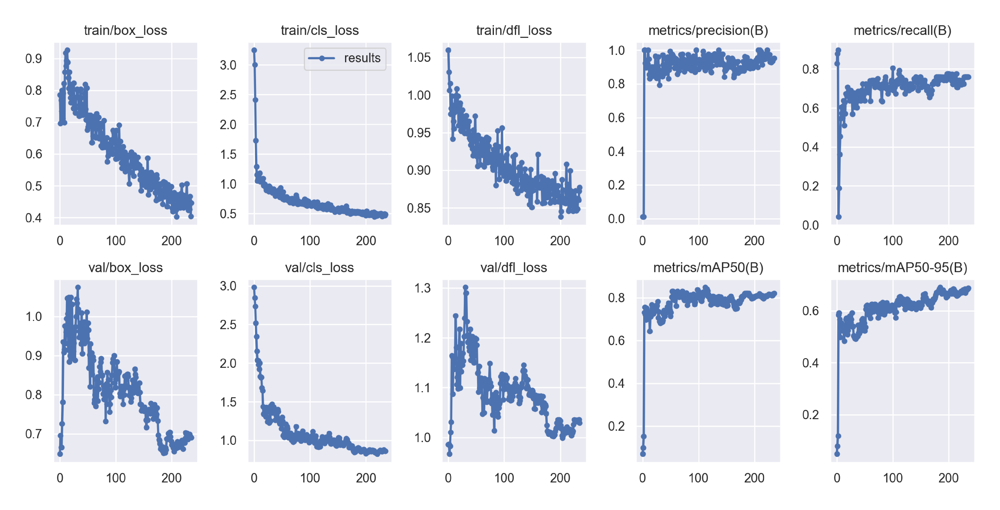

In [13]:
img = mpimg.imread(path2m + 'results.png')

fig = plt.figure(figsize=(12,12), dpi=500)

plt.imshow(img, interpolation='none')
plt.axis('off')
plt.show()

# View P, R, PR, and F1 curves
As we can see from the curves, this YOLO model is able to detect balloons at extreme efficiencies.

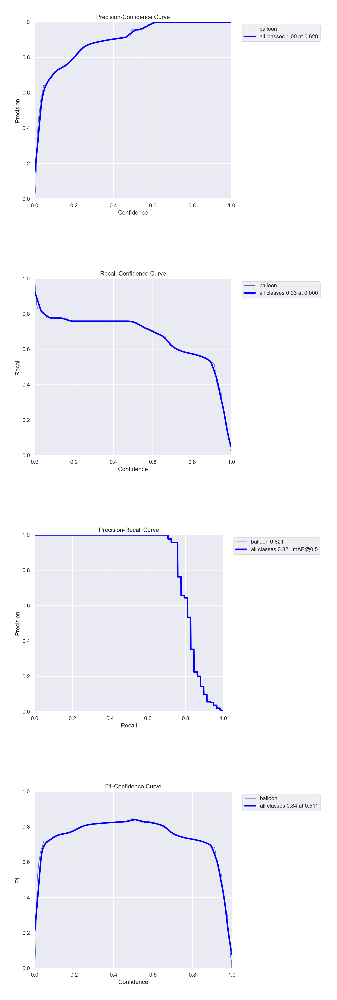

In [14]:
# Load the curve images
p_crv = mpimg.imread(path2m + 'P_curve.png')
r_crv = mpimg.imread(path2m + 'R_curve.png')
pr_crv = mpimg.imread(path2m + 'PR_curve.png')
f1_crv = mpimg.imread(path2m + 'F1_curve.png')

# Create a 2x2 grid of subplots
fig, axs = plt.subplots(4, 1, figsize=(5, 15), dpi=500)

# Display the curves in the subplots
axs[0].imshow(p_crv)
axs[1].imshow(r_crv)
axs[2].imshow(pr_crv)
axs[3].imshow(f1_crv)

# Turn off the axis labels
for ax in axs.flatten():
    ax.axis('off')

# Show the plot
plt.show()

# View Confusion Matrix
We have a good model!

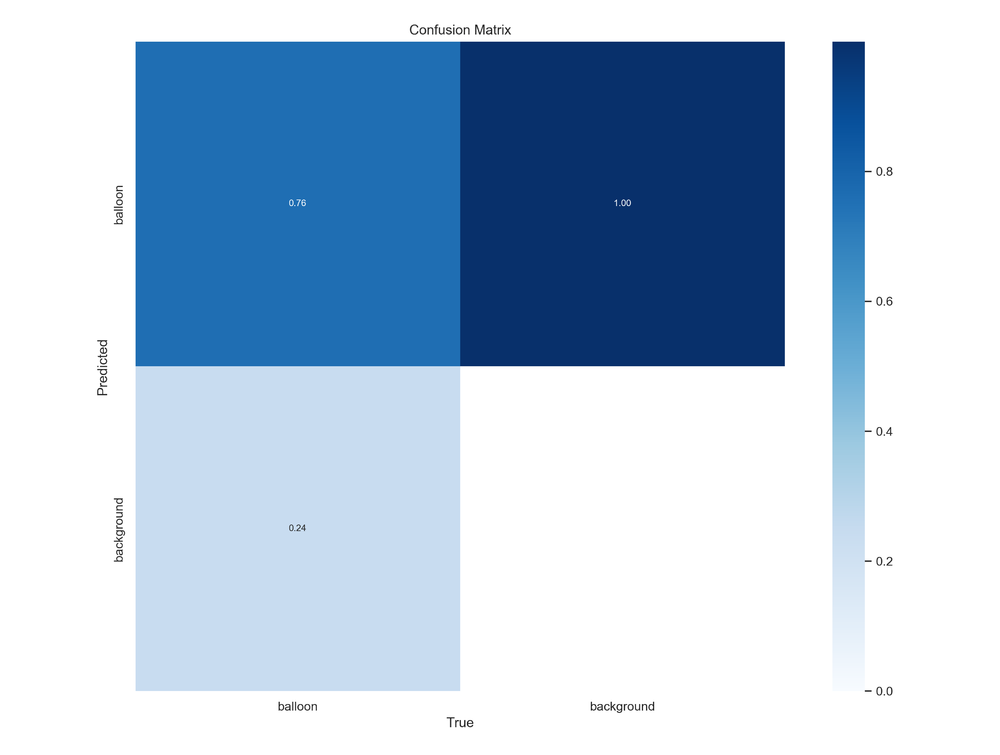

In [15]:
img = mpimg.imread(path2m + 'confusion_matrix.png')

fig = plt.figure(figsize=(12,12), dpi=500)

plt.imshow(img, interpolation='none')
plt.axis('off')
plt.show()

# Display Validation Images
YOLO made predictions on three sets of validation images. They're shown below along with their labeled counterparts

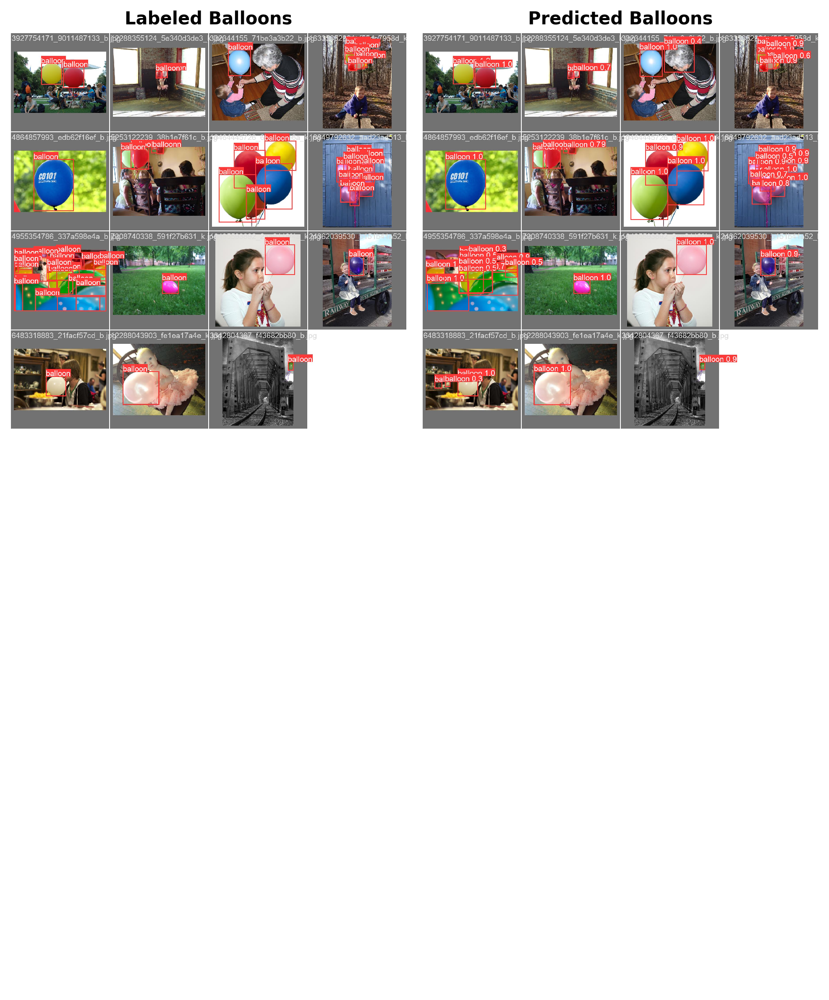

In [16]:
# Define the file locations of the images
img_files = [path2m + 'val_batch0_labels.jpg', path2m + 'val_batch0_pred.jpg']#,
#              path2m + 'val_batch1_labels.jpg', path2m + 'val_batch1_pred.jpg',
#              path2m + 'val_batch2_labels.jpg', path2m + 'val_batch2_pred.jpg',]

# Load the images into NumPy arrays
images = [mpimg.imread(f) for f in img_files]

# Create a 3x2 grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(8, 10), dpi=250)

# Set the left column to say "Labels" and the right column to say "Predicted"
axes[0, 0].set_title('Labeled Balloons', fontsize=12, fontweight='bold')
axes[0, 1].set_title('Predicted Balloons', fontsize=12, fontweight='bold')


# Plot each image in a subplot
for i, ax in enumerate(axes.flat):
    if i < len(images):
        ax.imshow(images[i], interpolation='none')
    ax.set_axis_off()

# Display the plot
plt.tight_layout()
plt.show()

# Test Custom YOLOv8 Model on Original Image
Enjoy this photo of me holding a balloon

In [5]:
!yolo task=detect mode=predict model=runs/detect/yolov8n_balloon10/weights/best.pt conf=0.5 source=test/ save=True save_txt=True

Ultralytics YOLOv8.0.58  Python-3.7.9 torch-1.13.1+cpu CPU
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs

image 1/5 G:\My Drive\RIT\Year 4\Spring 2023\Advanced Robotics\Project\yolov8\test\test_image1.jpg: 416x320 1 balloon, 95.5ms
image 2/5 G:\My Drive\RIT\Year 4\Spring 2023\Advanced Robotics\Project\yolov8\test\test_image2.jpg: 288x416 (no detections), 52.9ms
image 3/5 G:\My Drive\RIT\Year 4\Spring 2023\Advanced Robotics\Project\yolov8\test\test_image3.jpg: 416x416 1 balloon, 67.8ms
image 4/5 G:\My Drive\RIT\Year 4\Spring 2023\Advanced Robotics\Project\yolov8\test\test_image4.jpg: 416x416 1 balloon, 46.2ms
image 5/5 G:\My Drive\RIT\Year 4\Spring 2023\Advanced Robotics\Project\yolov8\test\test_image5.jpg: 256x416 1 balloon, 68.0ms
Speed: 1.1ms preprocess, 66.1ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 416)
Results saved to runs\detect\predict3
4 labels saved to runs\detect\predict3\labels


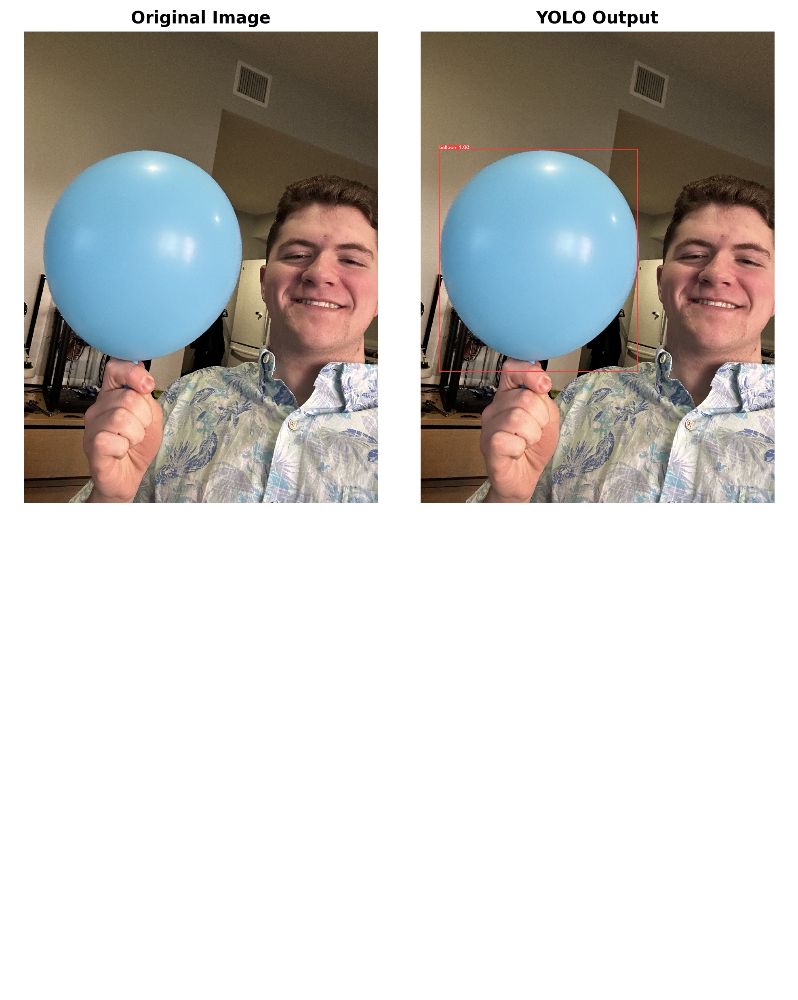

In [8]:
# Define the file locations of the images
img_files = ['test/test_image1.jpg', 'runs/detect/predict2/test_image1.jpg']

# Load the images into NumPy arrays
images = [mpimg.imread(f) for f in img_files]

# Create a 3x2 grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(8, 10), dpi=250)

# Set the left column to say "Labels" and the right column to say "Predicted"
axes[0, 0].set_title('Original Image', fontsize=12, fontweight='bold')
axes[0, 1].set_title('YOLO Output', fontsize=12, fontweight='bold')


# Plot each image in a subplot
for i, ax in enumerate(axes.flat):
    if i < len(images):
        ax.imshow(images[i], interpolation='none')
    ax.set_axis_off()

# Display the plot
plt.tight_layout()
plt.show()


# Print the location of the Bounding Box

In [23]:
# Load the YOLO output file
yolo_output_file = "runs/detect/predict/labels/test_image1.txt"
yolo_output = np.loadtxt(yolo_output_file, dtype=float, delimiter=" ")

# Extract the bounding box coordinates from the YOLO output
class_id, x, y, w, h = yolo_output

# Define the dimensions of the original image
width, height = 1056, 1056

# Calculate the coordinates of the top-left and bottom-right corners of the bounding box
x1 = int((x - w/2) * width)
y1 = int((y - h/2) * height)
x2 = int((x + w/2) * width)
y2 = int((y + h/2) * height)

# Print the bounding box coordinates
print("Bounding box: ({}, {}), ({}, {})".format(x1, y1, x2, y2))

Bounding box: (55, 263), (647, 760)


# Test an image with no balloons
We shouldn't see any bounding boxes in the output file

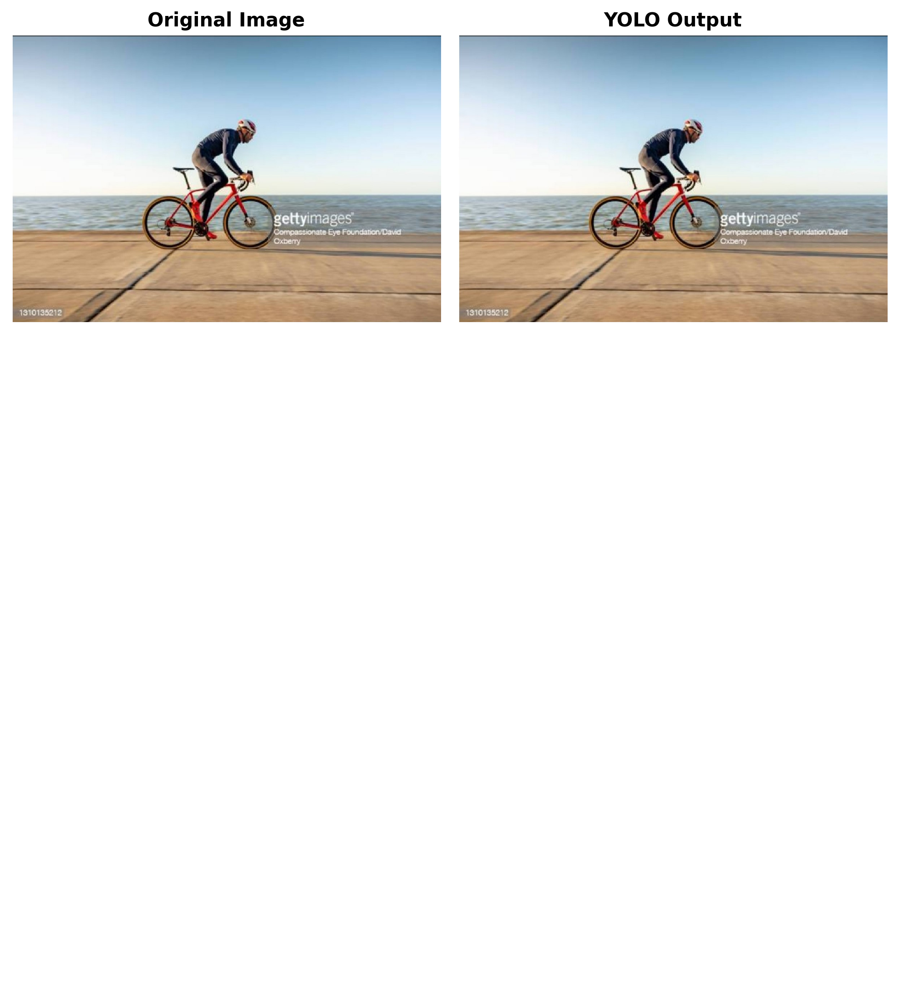

In [24]:
# Define the file locations of the images
img_files = ['test/test_image2.jpg', 'runs/detect/predict/test_image2.jpg']

# Load the images into NumPy arrays
images = [mpimg.imread(f) for f in img_files]

# Create a 3x2 grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(8, 10), dpi=250)

# Set the left column to say "Labels" and the right column to say "Predicted"
axes[0, 0].set_title('Original Image', fontsize=12, fontweight='bold')
axes[0, 1].set_title('YOLO Output', fontsize=12, fontweight='bold')


# Plot each image in a subplot
for i, ax in enumerate(axes.flat):
    if i < len(images):
        ax.imshow(images[i], interpolation='none')
    ax.set_axis_off()

# Display the plot
plt.tight_layout()
plt.show()


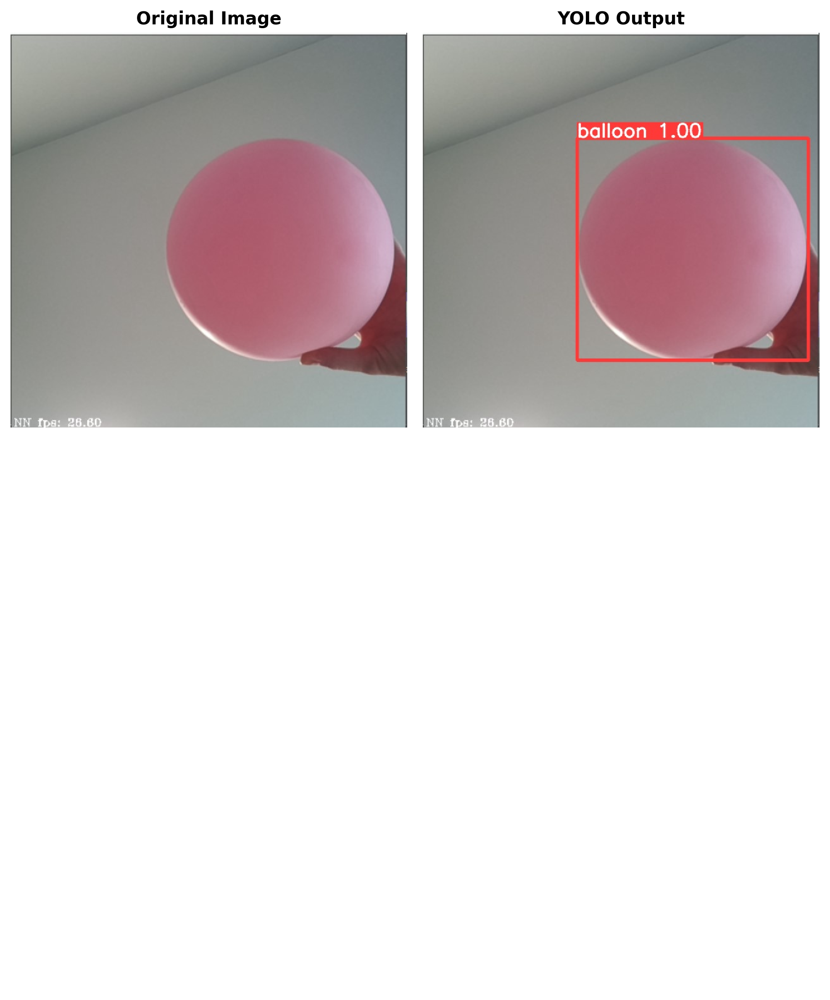

In [6]:
# Define the file locations of the images
img_files = ['test/test_image3.jpg', 'runs/detect/predict2/test_image3.jpg']

# Load the images into NumPy arrays
images = [mpimg.imread(f) for f in img_files]

# Create a 3x2 grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(8, 10), dpi=250)

# Set the left column to say "Labels" and the right column to say "Predicted"
axes[0, 0].set_title('Original Image', fontsize=12, fontweight='bold')
axes[0, 1].set_title('YOLO Output', fontsize=12, fontweight='bold')


# Plot each image in a subplot
for i, ax in enumerate(axes.flat):
    if i < len(images):
        ax.imshow(images[i], interpolation='none')
    ax.set_axis_off()

# Display the plot
plt.tight_layout()
plt.show()


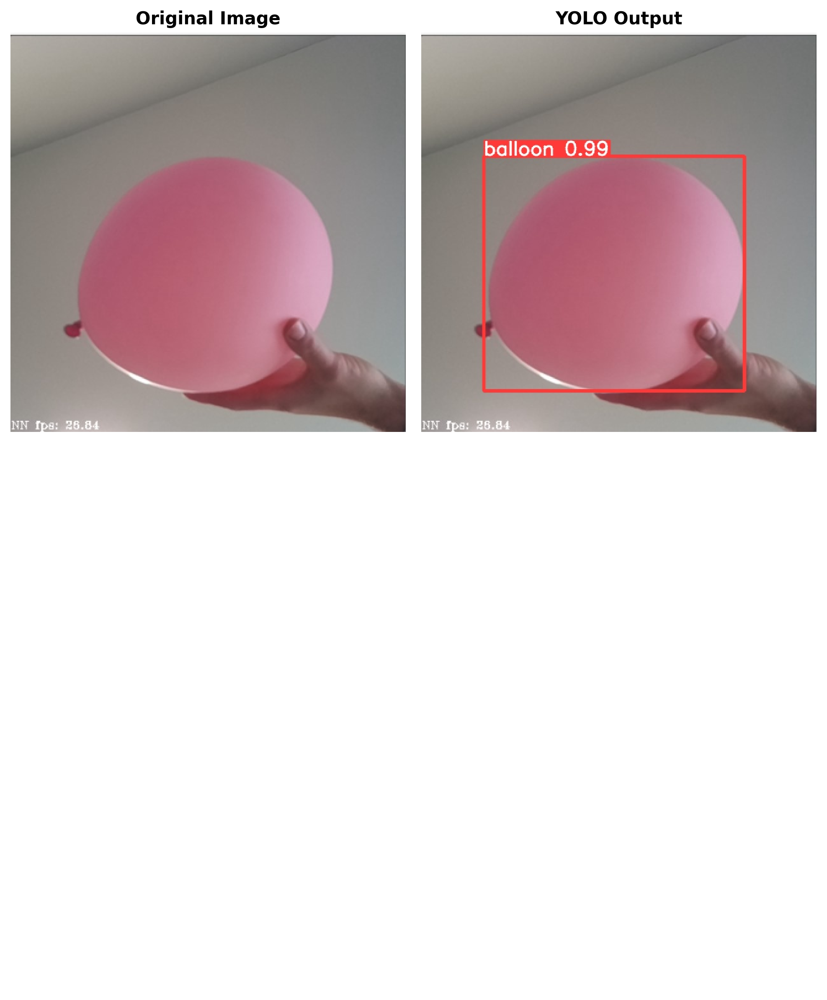

In [7]:
# Define the file locations of the images
img_files = ['test/test_image4.jpg', 'runs/detect/predict2/test_image4.jpg']

# Load the images into NumPy arrays
images = [mpimg.imread(f) for f in img_files]

# Create a 3x2 grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(8, 10), dpi=250)

# Set the left column to say "Labels" and the right column to say "Predicted"
axes[0, 0].set_title('Original Image', fontsize=12, fontweight='bold')
axes[0, 1].set_title('YOLO Output', fontsize=12, fontweight='bold')


# Plot each image in a subplot
for i, ax in enumerate(axes.flat):
    if i < len(images):
        ax.imshow(images[i], interpolation='none')
    ax.set_axis_off()

# Display the plot
plt.tight_layout()
plt.show()


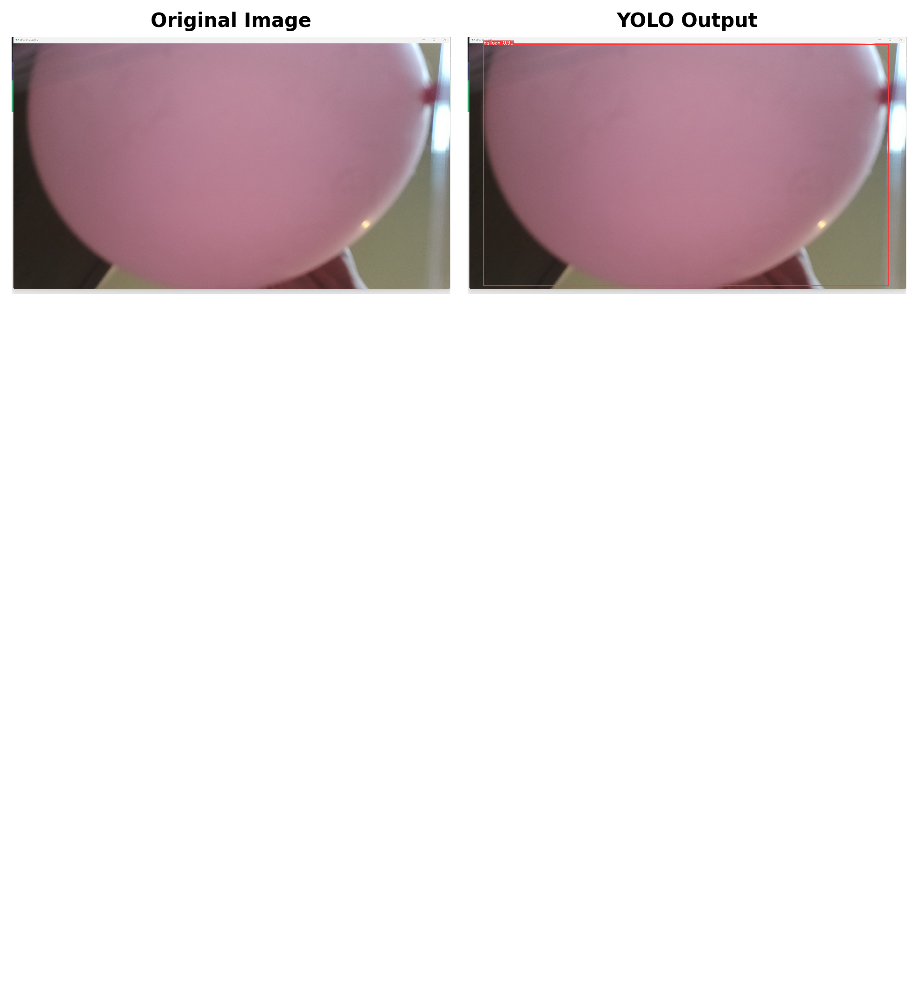

In [6]:
# Define the file locations of the images
img_files = ['test/test_image5.jpg', 'runs/detect/predict3/test_image5.jpg']

# Load the images into NumPy arrays
images = [mpimg.imread(f) for f in img_files]

# Create a 3x2 grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(8, 10), dpi=250)

# Set the left column to say "Labels" and the right column to say "Predicted"
axes[0, 0].set_title('Original Image', fontsize=12, fontweight='bold')
axes[0, 1].set_title('YOLO Output', fontsize=12, fontweight='bold')


# Plot each image in a subplot
for i, ax in enumerate(axes.flat):
    if i < len(images):
        ax.imshow(images[i], interpolation='none')
    ax.set_axis_off()

# Display the plot
plt.tight_layout()
plt.show()


# Convert weights from PyTorch to OpenVINO format
The weights must be converted to the OpenVINO to be deployed to an OAK-D camera with DepthAI
The OpenVINO files generated in the next cell will be used to generate blobs for a DepthAI pipeline via upload to http://blobconverter.luxonis.com/

In [31]:
!yolo export model=runs/detect/yolov8n_balloon10/weights/best.pt imgsz=416 format=OpenVINO opset=12

Ultralytics YOLOv8.0.58  Python-3.7.9 torch-1.13.1+cpu CPU
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs

PyTorch: starting from runs\detect\yolov8n_balloon10\weights\best.pt with input shape (1, 3, 416, 416) BCHW and output shape(s) (1, 5, 3549) (5.9 MB)

ONNX: starting export with onnx 1.13.1...
ONNX: export success  0.6s, saved as runs\detect\yolov8n_balloon10\weights\best.onnx (11.6 MB)

OpenVINO: starting export with openvino 2022.3.0-9052-9752fafe8eb-releases/2022/3...
OpenVINO: export success  3.7s, saved as runs\detect\yolov8n_balloon10\weights\best_openvino_model\ (11.7 MB)

Export complete (4.5s)
Results saved to G:\My Drive\RIT\Year 4\Spring 2023\Advanced Robotics\Project\yolov8\runs\detect\yolov8n_balloon10\weights
Predict:         yolo predict task=detect model=runs\detect\yolov8n_balloon10\weights\best_openvino_model imgsz=416 
Validate:        yolo val task=detect model=runs\detect\yolov8n_balloon10\weights\best_openvino_model imgsz=416 d

# Calculate Anchor Boxes

In [13]:
from sklearn.cluster import KMeans

# Path to the folder containing the training annotation files
ann_folder = base_dir + "/labels/train/"

# List all the annotation files in the folder
ann_files = os.listdir(ann_folder)

# Load the bounding boxes from the annotation files
boxes = []
for ann_file in ann_files:
    with open(os.path.join(ann_folder, ann_file), "r") as f:
        lines = f.readlines()
        for line in lines:
            box = line.strip().split()
            boxes.append([float(box[3]), float(box[4])])

# Perform k-means clustering on the bounding boxes to determine the anchor box sizes
num_anchor_boxes = 3
kmeans = KMeans(n_clusters=num_anchor_boxes)
kmeans.fit(boxes)

# Extract the anchor box dimensions from the k-means clusters
anchor_box_sizes = kmeans.cluster_centers_

# Define the anchor box aspect ratios
anchor_box_aspect_ratios = [(1.0, 1.0), (1.0, 0.5), (0.5, 1.0)]

# Print the anchor box sizes and aspect ratios
print("Anchor box sizes: ", anchor_box_sizes)
print("Anchor box aspect ratios: ", anchor_box_aspect_ratios)


Anchor box sizes:  [[0.10015182 0.11443508]
 [0.23082139 0.30423131]
 [0.44596353 0.61528776]]
Anchor box aspect ratios:  [(1.0, 1.0), (1.0, 0.5), (0.5, 1.0)]
